# Instance Segmentation of Powder Particles and Satellites

In [1]:
## regular module imports
import cv2
import json
import matplotlib.pyplot as plt
import numpy as np
import os
from pathlib import Path
import pickle
import skimage.io
import sys

## detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.data import (
    DatasetCatalog,
    MetadataCatalog,
)
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.structures import BoxMode

## ampis
ampis_root = Path('../../')
sys.path.append(str(ampis_root))

from ampis import data_utils, visualize


# Loading Data
The process for training models for powder particles and satellites is identical. Enter the corresponding value depending on which model you want to train. The paths to individual images, and all annotation data are stored in the JSON files generated by the VGG image annotator.

In [2]:
EXPERIMENT_NAME = 'particle' # can be 'particles' or 'satellite'
json_path_train = Path('via_2.0.8/', f'via_powder_{EXPERIMENT_NAME}_masks_training.json')  # path to training data
json_path_val = Path('via_2.0.8/', f'via_powder_{EXPERIMENT_NAME}_masks_validation.json')  # path to training data

assert json_path_train.is_file(), 'training file not found!'
assert json_path_val.is_file(), 'validation file not found!'

## Registration
Detectron2 requires that datasets be registered for later use.
Registration stores the name of the dataset and a function that can be used to retrieve the image paths and labels in a format that the model can use.

In [3]:
DatasetCatalog.clear()  # resets catalog, helps prevent errors from running cells multiple times

# store names of datasets that will be registered for easier access later
dataset_train = f'{EXPERIMENT_NAME}_Train'
dataset_valid = f'{EXPERIMENT_NAME}_Val'

# register the training dataset
DatasetCatalog.register(dataset_train, lambda f = json_path_train: data_utils.get_ddicts(label_fmt='via2',  # annotations generated from vgg image annotator
                                                                                                     im_root=f,  # path to the training data json file
                                                                                                     dataset_class='Train'))  # indicates this is training data
# register the validation dataset
DatasetCatalog.register(dataset_valid, lambda f = json_path_val: data_utils.get_ddicts(label_fmt='via2',  # annotations generated from vgg image annotator
                                                                                                im_root=f,  # path to validation data json file
                                                                                                dataset_class='Validation'))  # indicates this is validation data
print(f'Registered Datasets: {list(DatasetCatalog._REGISTERED.keys())}')

## There is also a metadata catalog, which stores the class names.
for d in [dataset_train, dataset_valid]:
    MetadataCatalog.get(d).set(**{'thing_classes': [EXPERIMENT_NAME]})

Registered Datasets: ['particle_Train', 'particle_Val']


## Verify images and annotations are loaded correctly
Also, this is a great time to admire my hand-drawn labels, which took sooooo long to do!
### Training Data

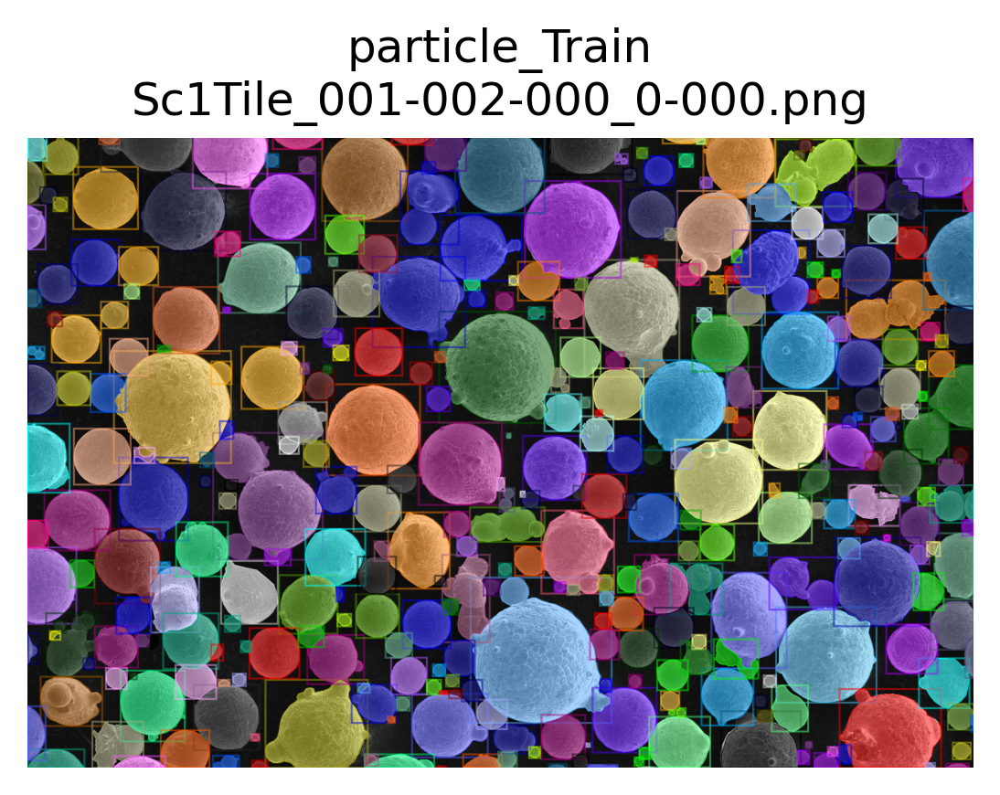

ddict info:
	path: via_2.0.8/../images_png/Sc1Tile_001-002-000_0-000.png
	num_instances: 351


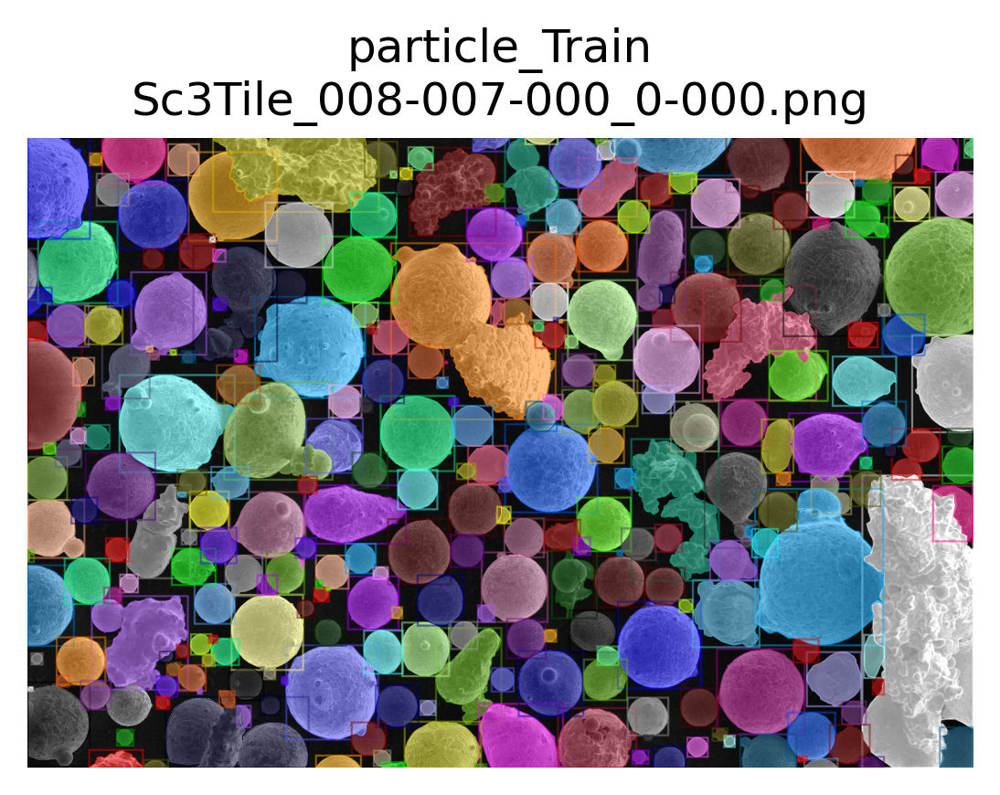

ddict info:
	path: via_2.0.8/../images_png/Sc3Tile_008-007-000_0-000.png
	num_instances: 293


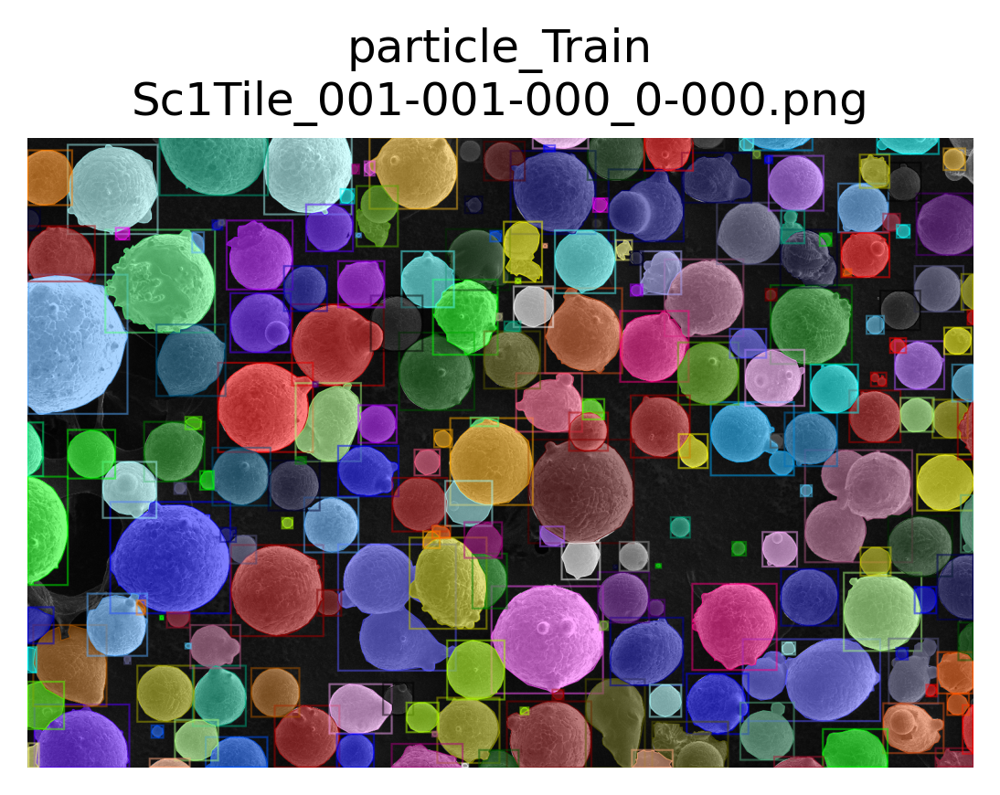

ddict info:
	path: via_2.0.8/../images_png/Sc1Tile_001-001-000_0-000.png
	num_instances: 219


In [4]:
for i in np.random.choice(DatasetCatalog.get(dataset_train), 3, replace=False):
    visualize.quick_visualize_ddicts(i, None, dataset_train, suppress_labels=True)

### Validation Data

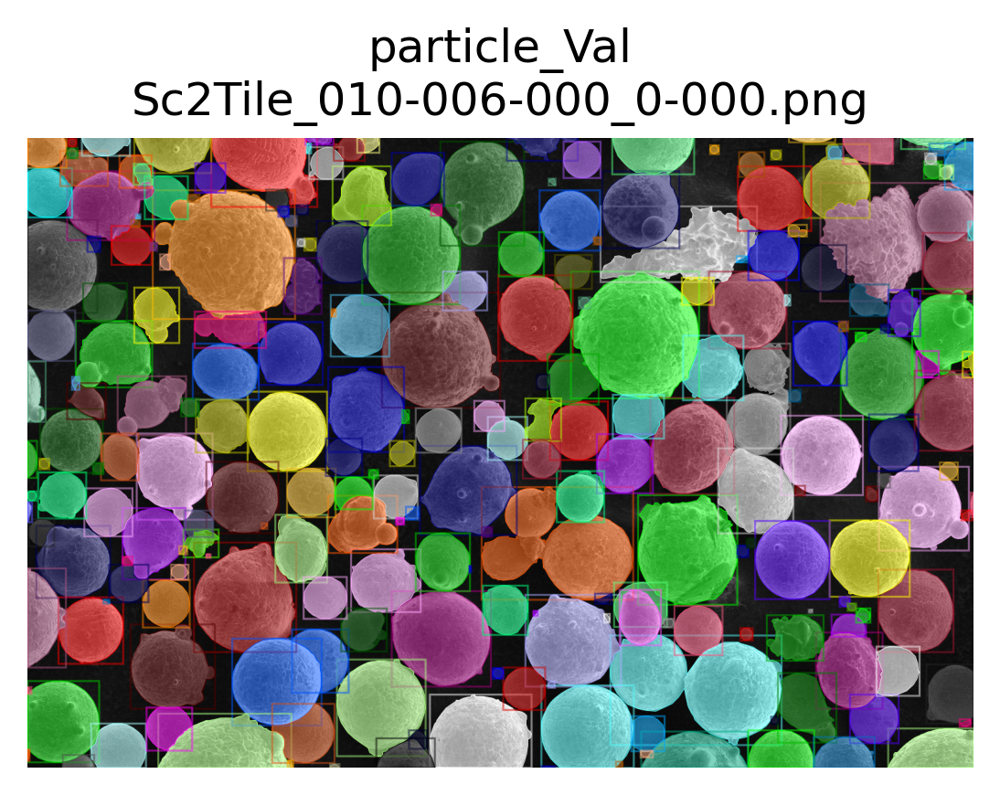

ddict info:
	path: via_2.0.8/../images_png/Sc2Tile_010-006-000_0-000.png
	num_instances: 238


In [5]:
for i in DatasetCatalog.get(dataset_valid):
    visualize.quick_visualize_ddicts(i, None, dataset_valid, suppress_labels=True)

## Model Configuration
This is where we specify the directory where the outputs are saved, various hyperparameters for the model, and more.

In [4]:
cfg = get_cfg() # initialize cfg object
cfg.merge_from_file(model_zoo.get_config_file('COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'))  # load default parameters for Mask R-CNN
cfg.INPUT.MASK_FORMAT = 'polygon'  # masks generated in VGG image annotator are polygons
cfg.DATASETS.TRAIN = (dataset_train,)  # dataset used for training model
cfg.DATASETS.TEST = (dataset_train, dataset_valid)  # we will look at the predictions on both sets after training
cfg.SOLVER.IMS_PER_BATCH = 1 # number of images per batch (across all machines)
cfg.SOLVER.CHECKPOINT_PERIOD = 400  # number of iterations after which to save model checkpoints
cfg.MODEL.DEVICE='cpu'  # 'cpu' to force model to run on cpu, 'cuda' if you have a compatible gpu
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1 # Since we are training separate models for particles and satellites there is only one class output
cfg.TEST.DETECTIONS_PER_IMAGE = 400 if EXPERIMENT_NAME == 'particle' else 150  # maximum number of instances that can be detected in an image (this is fixed in mask r-cnn)
cfg.SOLVER.MAX_ITER = 2000  # maximum number of iterations to run during training
                            # Increasing this may improve the training results, but will take longer to run (especially without a gpu!)

# model weights will be downloaded if they are not present
weights_path = Path('..','..','models','model_final_f10217.pkl')
if weights_path.is_file():
    print('Using locally stored weights: {}'.format(weights_path))
else:
    weights_path = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
    print('Weights not found, weights will be downloaded from source: {}'.format(weights_path))
cfg.MODEL.WEIGHTs = str(weights_path)
cfg.OUTPUT_DIR = str(Path(f'{EXPERIMENT_NAME}_output'))
# make the output directory
os.makedirs(Path(cfg.OUTPUT_DIR), exist_ok=True)

Using locally stored weights: ../../models/model_final_f10217.pkl


# Model Training
Once we have everything set up, training is very easy!

Note- this block will generate a huge wall of text.

In [ ]:
trainer = DefaultTrainer(cfg)  # create trainer object from cfg
trainer.resume_or_load(resume=False)  # start training from iteration 0
trainer.train()  # train the model!

# Visualizing model predictions
We will view the model predictions on the training and validation set.

In [5]:
model_checkpoints = sorted(Path(cfg.OUTPUT_DIR).glob('*.pth'))  # paths to weights saved druing training
cfg.DATASETS.TEST = (dataset_train, dataset_valid)  # predictor requires this field to not be empty
cfg.MODEL.WEIGHTS = str(model_checkpoints[-1])  # use the last model checkpoint saved during training. If you want to see the performance of other checkpoints you can select a different index from model_checkpoints.
predictor = DefaultPredictor(cfg)  # create predictor object

## Generating predictions on new images is simple.
We will load a new image (not included in either dataset) and generate predictions.
Note that we do not have labels for this image and do not need to register it to a dataset.

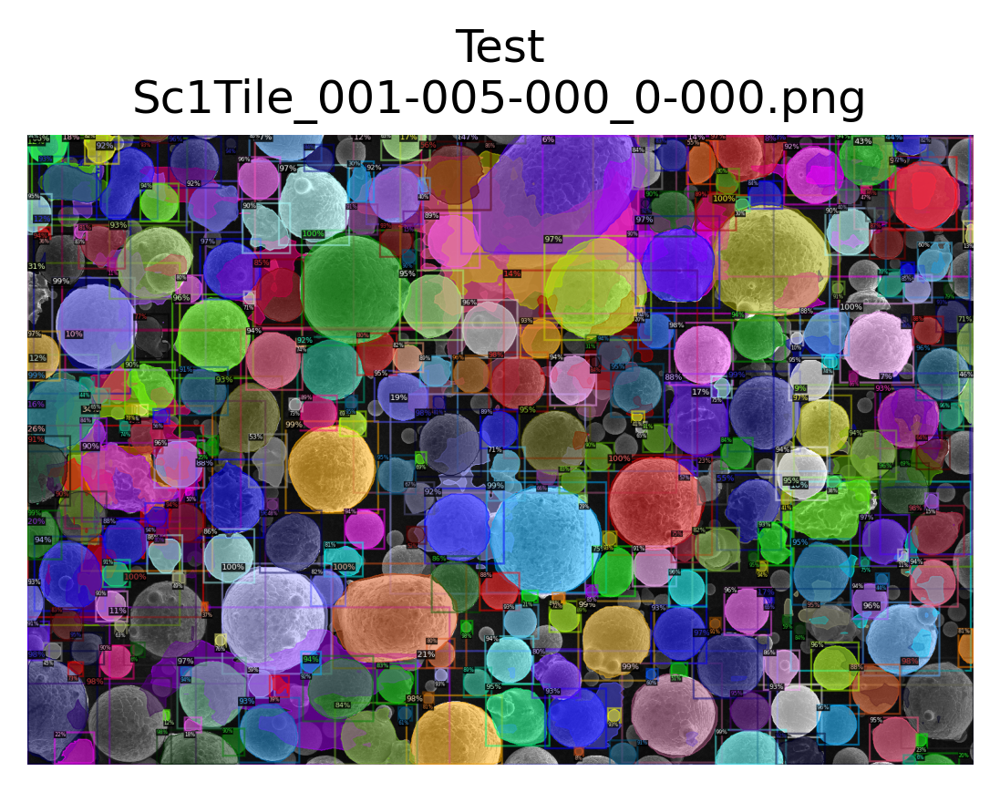

ddict info:
	path: images_png/Sc1Tile_001-005-000_0-000.png
	num_instances: 312


In [6]:
img_path = Path('images_png','Sc1Tile_001-005-000_0-000.png')
img = cv2.imread(str(img_path))
outs = predictor(img)
visualize.quick_visualize_ddicts(ddict=outs['instances'],  # predictions to display
                                 outpath=None, 'Test',  # don't save figure
                                 gt=False,  # specifies format as model predictions
                                img_path=img_path)  # path to image


We will now generate predictions on all of the images in the training and validation sets, and save the results for later.

Dataset: particle_Train
	File: via_2.0.8/../images_png/Sc1Tile_001-001-000_0-000.png


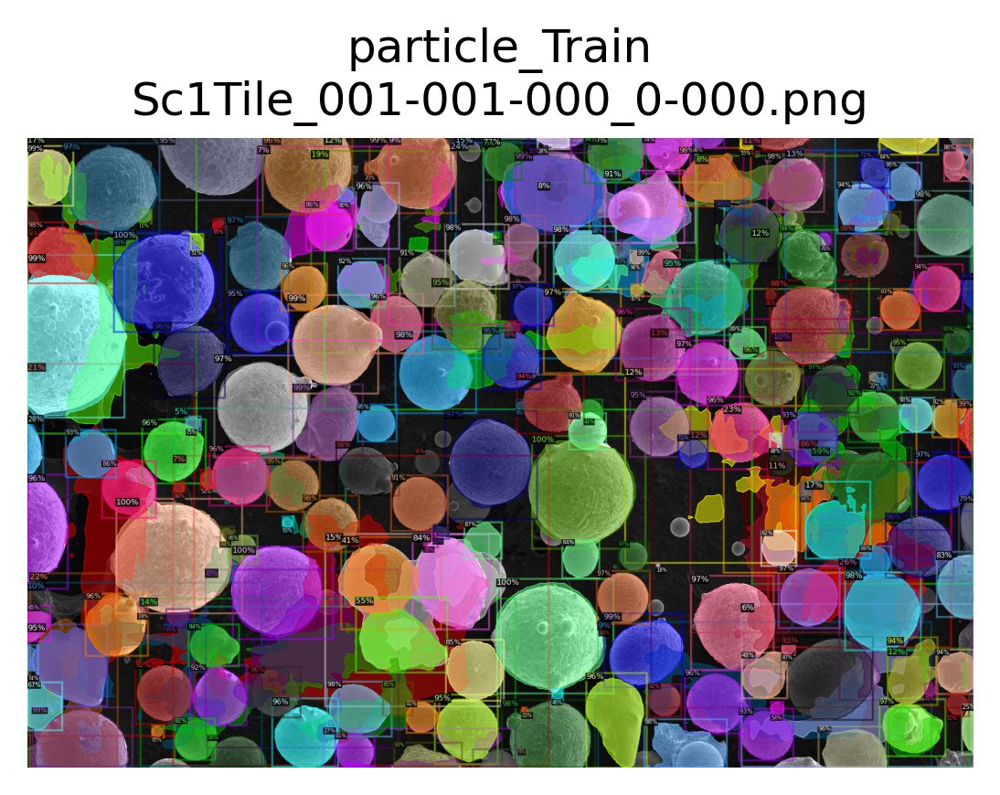

ddict info:
	path: via_2.0.8/../images_png/Sc1Tile_001-001-000_0-000.png
	num_instances: 221
	File: via_2.0.8/../images_png/Sc1Tile_001-002-000_0-000.png


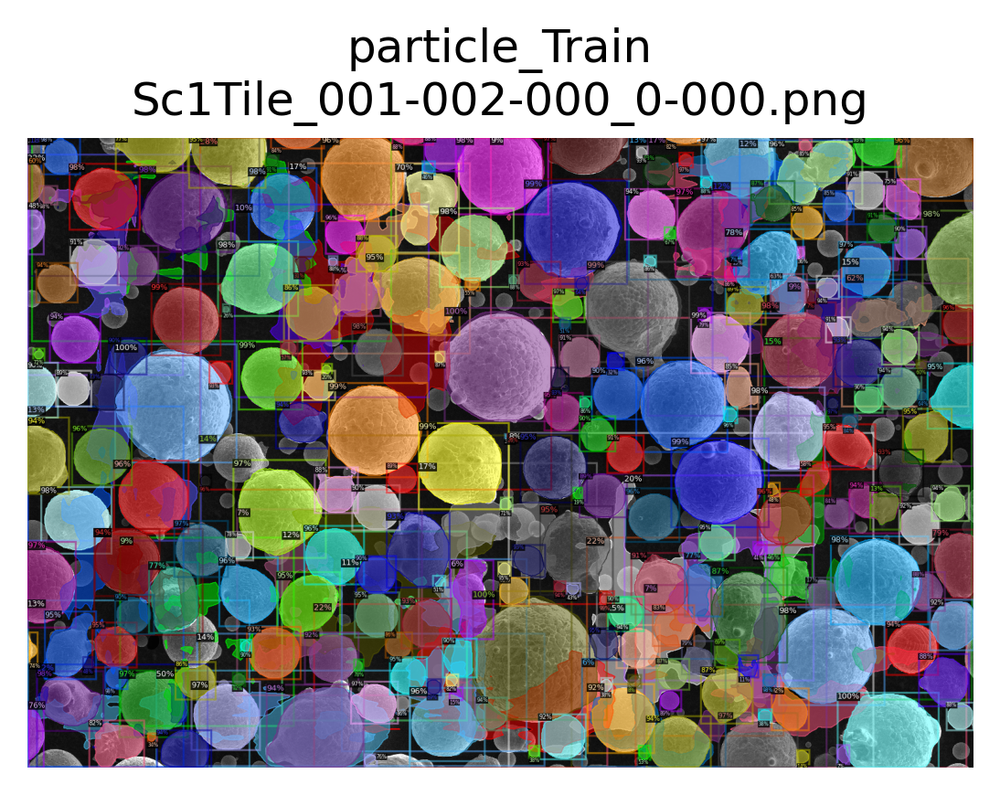

ddict info:
	path: via_2.0.8/../images_png/Sc1Tile_001-002-000_0-000.png
	num_instances: 271
	File: via_2.0.8/../images_png/Sc2Tile_001-001-000_0-000.png


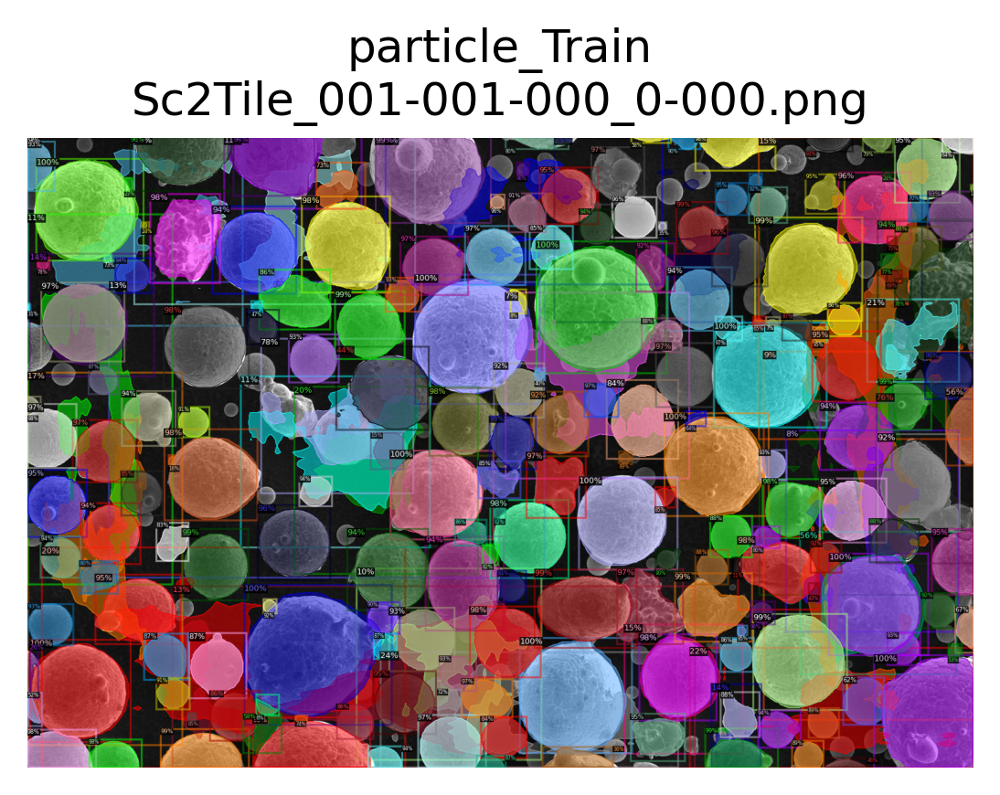

ddict info:
	path: via_2.0.8/../images_png/Sc2Tile_001-001-000_0-000.png
	num_instances: 218
	File: via_2.0.8/../images_png/Sc3Tile_008-007-000_0-000.png


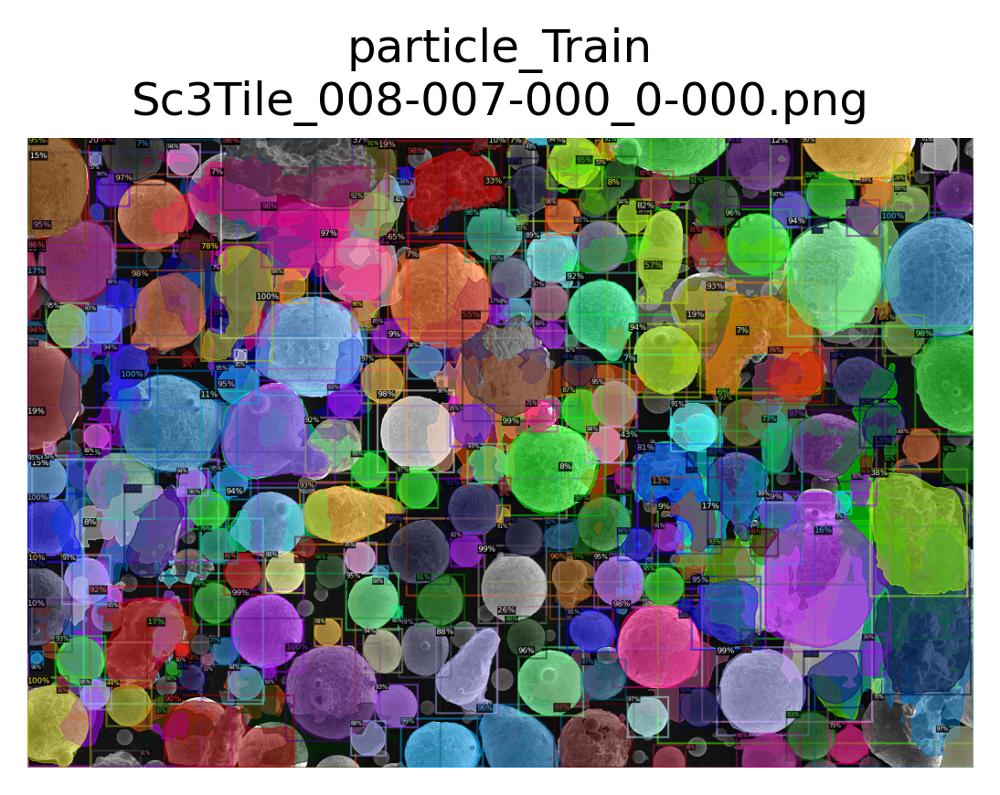

ddict info:
	path: via_2.0.8/../images_png/Sc3Tile_008-007-000_0-000.png
	num_instances: 252
Dataset: particle_Val
	File: via_2.0.8/../images_png/Sc2Tile_010-006-000_0-000.png


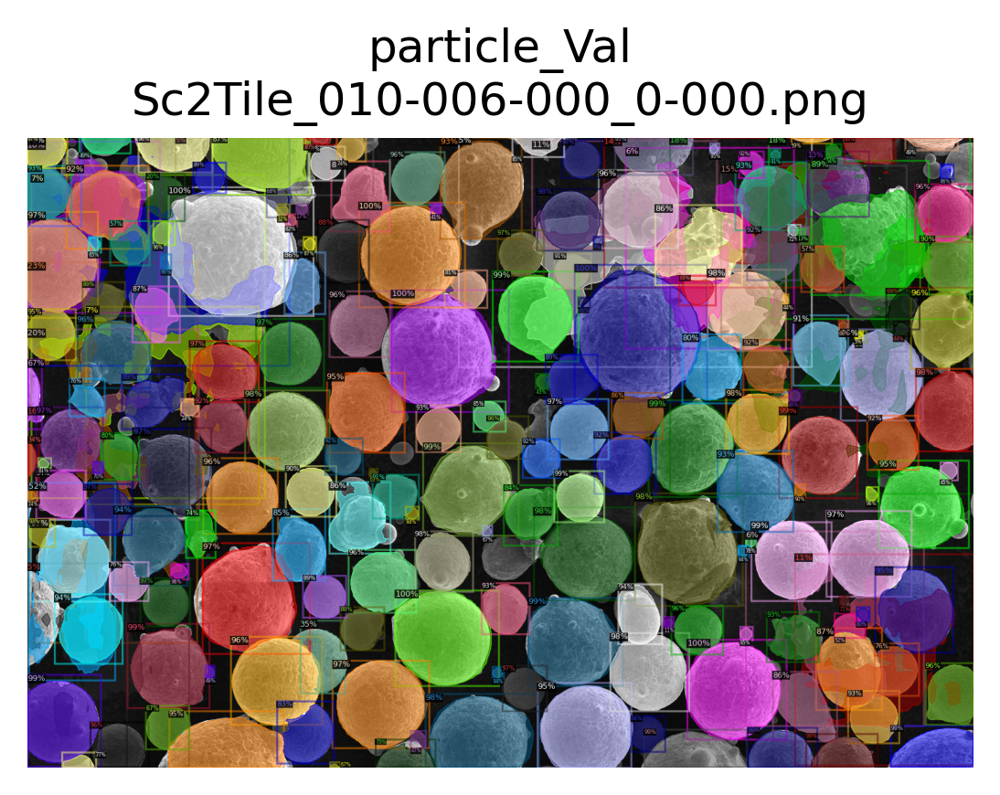

ddict info:
	path: via_2.0.8/../images_png/Sc2Tile_010-006-000_0-000.png
	num_instances: 210


In [7]:
results = []
for ds in cfg.DATASETS.TEST:
    print(f'Dataset: {ds}')
    for dd in DatasetCatalog.get(ds):
        print(f'\tFile: {dd["file_name"]}')
        img = cv2.imread(dd['file_name'])  # load image
        outs = predictor(img)  # run inference on image
        # visualize results
        visualize.quick_visualize_ddicts(outs['instances'], None, ds, gt=False, img_path=dd['file_name'])
        # store for later
        results.append(data_utils.format_outputs(dd['file_name'], ds, outs))

# save to disk
with open(Path('data',f'{EXPERIMENT_NAME}-results.pickle'), 'wb') as f:
    pickle.dump(results, f)